<a href="https://colab.research.google.com/github/Singh-sid930/depth_mapping/blob/master/Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
from google.colab import drive
drive.mount('/content/drive')

import os
from google.colab import drive

# Mount google drive
DRIVE_MOUNT='/content/gdrive'
drive.mount(DRIVE_MOUNT)


# create folder to write data to
CIS680_FOLDER=os.path.join(DRIVE_MOUNT, 'My Drive', 'good_data')
PROJECT_FOLDER = os.path.join(CIS680_FOLDER, 'Data')
TEST_FOLDER = os.path.join(CIS680_FOLDER, 'Test')
os.makedirs(PROJECT_FOLDER, exist_ok=True)

# bootstrap environment into place
from google.colab import auth
auth.authenticate_user()

from googleapiclient.discovery import build
drive_service = build('drive', 'v3')

import io
import os
from googleapiclient.http import MediaIoBaseDownload

def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    
    downloaded.seek(0)

    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)

    with open(fn, 'wb') as f:
        f.write(downloaded.read())

id_to_fn = {
}

# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)


Mounted at /content/drive


Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/__init__.py", line 36, in autodetect
    from google.appengine.api import memcache
ModuleNotFoundError: No module named 'google.appengine'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 33, in <module>
    from oauth2client.contrib.locked_file import LockedFile
ModuleNotFoundError: No module named 'oauth2client.contrib.locked_file'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 37, in <module>
    from oauth2client.locked_file import LockedFile
ModuleNotFoundError: No module named 'oauth2client.locked_file'

During handling of the above exception, another exceptio

Mounted at /content/gdrive


In [2]:
import torch
import torchvision
from torch.utils.tensorboard import SummaryWriter
import time, datetime


%load_ext tensorboard

!mkdir -p ./logs
!cp -r /content/gdrive/My\ Drive/good_data/logs/* ./logs/


get_ipython().system_raw(
    '''cp -r ./logs/*  '{}' '''
    .format(os.path.join(CIS680_FOLDER , 'logs') + '/')
)

# !rm -r ./logs

LOG_DIR = './logs/'
get_ipython().system_raw(
    'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
    .format(LOG_DIR)
)

!if [ -f ngrok ] ; then echo "Ngrok already installed" ; else wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip > /dev/null 2>&1 && unzip ngrok-stable-linux-amd64.zip > /dev/null 2>&1 ; fi
  
get_ipython().system_raw('./ngrok http 6006 &')

! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print('Tensorboard Link: ' +str(json.load(sys.stdin)['tunnels'][0]['public_url']))"

%tensorboard --logdir logs

Ngrok already installed
Tensorboard Link: https://469d032f.ngrok.io


Reusing TensorBoard on port 6007 (pid 588), started 1:44:20 ago. (Use '!kill 588' to kill it.)

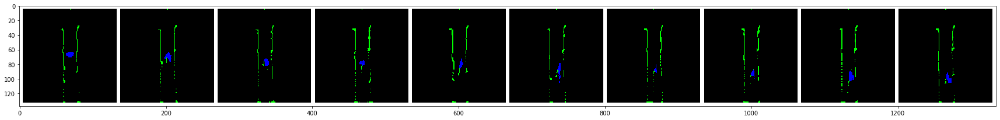

In [3]:
# torch and torchvision imports
import random
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from torch.optim.lr_scheduler import StepLR
import torch.nn as nn
from torch.utils import data
import h5py
import numpy as np
import math
from skimage import io, transform
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pyplot import *


class DepthDataset(torch.utils.data.Dataset):
  def __init__(self, path, frame_count = 7, frame_interval = 1, width = 128, height = 128):
    self.path = path
    self.frame_names = sorted(sorted(os.listdir(self.path)), key=len)
    self.frame_count = frame_count
    self.width = width
    self.height = height
    self.frame_interval = frame_interval
    
  def __len__(self):
    return len(self.frame_names) + (1 - self.frame_count) * self.frame_interval


  def __getitem__(self, index):
    batch = {'index': index}
    frames = np.zeros((self.frame_count, self.height, self.width, 3))


    for i in range(self.frame_count):
      frames[i] = transform.resize(mpimg.imread(os.path.join(PROJECT_FOLDER, self.frame_names[index + i* self.frame_interval])) / 255, (self.height, self.width))

    batch['frames'] = torch.from_numpy(frames).float().cuda().permute(0,3,1,2)



    batch['frames'][batch['frames'] >= 0.5] = 1
    batch['frames'][batch['frames'] < 0.5] = 0

    wall_id = (batch['frames'][:,0] == 1) & (batch['frames'][:,1] == 1) & (batch['frames'][:,2] == 1)

    batch['frames'][:, 0][wall_id] = 0
    batch['frames'][:, 1][wall_id] = 1
    batch['frames'][:, 2][wall_id] = 0

    
    return batch


frame_count = 10
datasetTester = DepthDataset(PROJECT_FOLDER, frame_count)
datasetIndex = 7
testVal = datasetTester[datasetIndex]
fig, ax = subplots(figsize=(30, 20))
ax.imshow(torchvision.utils.make_grid(testVal['frames'], nrow = frame_count, padding = 5, pad_value = 1).permute(1, 2, 0).cpu())
# torch.set_printoptions(profile="full")
# print(testVal['frames'][0])
# torch.set_printoptions(profile="default")

In [0]:
import torch
import torch.nn as nn
from torch.nn import init
from torch.nn import functional as func

device =  torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
class RecurrentBlock(nn.Module):

    def __init__(self, in_channel, out_channel, downsample = False, upsample = False, bottleneck = False):
        super(RecurrentBlock, self).__init__()

        self.in_channel = in_channel
        self.out_channel = out_channel

        self.downsample = downsample
        self.upsample = upsample
        self.bottleneck = bottleneck

        self.hidden = None

        if self.downsample:
            self.layer1 = nn.Sequential(
                            nn.Conv2d(in_channel, out_channel, 3, padding = 1),
                            nn.BatchNorm2d(out_channel),
                            nn.LeakyReLU(negative_slope = 0.1)
                            )
            self.layer2 = nn.Sequential(
                            nn.Conv2d(2*out_channel, out_channel, 3, padding = 1),
                            nn.LeakyReLU(negative_slope = 0.1),
                            nn.BatchNorm2d(out_channel),
                            nn.Conv2d(out_channel, out_channel, 3, padding = 1),
                            nn.BatchNorm2d(out_channel),
                            nn.LeakyReLU(negative_slope = 0.1)
            )

        elif self.upsample:
            self.layer1 = nn.Sequential(
					nn.Upsample(scale_factor=2, mode='nearest'),
					nn.Conv2d(2 * in_channel, out_channel, 3, padding=1),
                    nn.BatchNorm2d(out_channel),
					nn.LeakyReLU(negative_slope=0.1),
					nn.Conv2d(out_channel, out_channel, 3, padding=1),
                    nn.BatchNorm2d(out_channel),
					nn.LeakyReLU(negative_slope=0.1),
				)

        elif self.bottleneck:
            self.layer1 = nn.Sequential(
                            nn.Conv2d(in_channel, out_channel, 3, padding = 1),
                            nn.BatchNorm2d(out_channel),
                            nn.LeakyReLU(negative_slope=0.1)
                            )
            self.layer2 = nn.Sequential(
                            nn.Conv2d(2*out_channel, out_channel, 3, padding =1),
                            nn.BatchNorm2d(out_channel),
                            nn.LeakyReLU(negative_slope = 0.1),
                            nn.Conv2d(out_channel, out_channel, 3, padding  = 1),
                            nn.BatchNorm2d(out_channel),
                            nn.LeakyReLU(negative_slope = 0.1)
                            )

    def forward(self, X):
        if self.downsample:
             out1 = self.layer1(X)
             out2 = self.layer2(torch.cat((out1, self.hidden), dim=1))
             self.hidden = out2

             return out2

        if self.upsample:
            return self.layer1(X)

        if self.bottleneck:
            out1 = self.layer1(X)
            out2 = self.layer2(torch.cat((out1, self.hidden), dim=1))

            self.hidden = out2

            return out2

    def init_hidden(self, X, factor):
        size = list(X.size())
        size[1] = self.out_channel
        size[2] = int(size[2]/factor)
        size[3] = int(size[3]/factor)

        self.hidden_size = size
        self.hidden = torch.zeros(*(size)).to(device)


class AutoEncoder(nn.Module):

    def __init__(self, in_channel):
        super(AutoEncoder, self).__init__()

        self.encoder1 = nn.Sequential(RecurrentBlock(in_channel,32, downsample = True),
                                    nn.MaxPool2d(2))
        self.encoder2 = nn.Sequential(RecurrentBlock(32, 43, downsample = True),
                                    nn.MaxPool2d(2))
        self.encoder3 = nn.Sequential(RecurrentBlock(43, 57, downsample = True),
                                    nn.MaxPool2d(2))
        self.encoder4 = nn.Sequential(RecurrentBlock(57, 76, downsample = True),
                                    nn.MaxPool2d(2))
        self.encoder5 = nn.Sequential(RecurrentBlock(76, 101, downsample = True),
                                    nn.MaxPool2d(2))

        self.bottleneck = RecurrentBlock(101, 101, bottleneck = True)

        self.decoder5 = RecurrentBlock(101, 76, upsample = True)
        self.decoder4 = RecurrentBlock(76, 57, upsample = True)
        self.decoder3 = RecurrentBlock(57, 43, upsample = True)
        self.decoder2 = RecurrentBlock(43, 32, upsample = True)
        self.decoder1 = RecurrentBlock(32, 3, upsample = True)

        self.pool = nn.MaxPool2d(kernel_size = 2)


    def forward(self, input, j=0):
        if j==0:
            self.encoder1[0].init_hidden(input, 1)
            self.encoder2[0].init_hidden(input, 2)
            self.encoder3[0].init_hidden(input, 4)
            self.encoder4[0].init_hidden(input, 8)
            self.encoder5[0].init_hidden(input, 16)

            self.bottleneck.init_hidden(input, 32)
        encoder1 = self.encoder1(input)
        encoder2 = self.encoder2(encoder1)
        encoder3 = self.encoder3(encoder2)
        encoder4 = self.encoder4(encoder3)
        encoder5 = self.encoder5(encoder4)

        bottleneck = self.bottleneck(encoder5)
        decoder5 = self.decoder5(torch.cat((bottleneck, encoder5), dim=1))
        decoder4 = self.decoder4(torch.cat((decoder5, encoder4), dim=1))
        decoder3 = self.decoder3(torch.cat((decoder4, encoder3), dim=1))
        decoder2 = self.decoder2(torch.cat((decoder3, encoder2), dim=1))
        decoder1 = self.decoder1(torch.cat((decoder2, encoder1), dim=1))

        return decoder1

In [9]:
%tensorboard --logdir logs
now = time.mktime(datetime.datetime.now().timetuple())
logger = SummaryWriter(f'./logs/RecurrentAutoEncoderWithSkipConnections_ComplexLoss_{now}/')

model = AutoEncoder(3).cuda()

def init_weights(m):
    if type(m) == nn.Conv2d:
        torch.nn.init.kaiming_normal_(m.weight, mode = 'fan_in')
        m.bias.data.fill_(0.01)


model.apply(init_weights)
optimizer = torch.optim.SGD(model.parameters(), lr = 1e-3, momentum = 0.9, weight_decay = 1e-4)
scheduler = StepLR(optimizer, step_size = 20, gamma=0.8)


def LoG(img):
	weight = [
        [0,1,0],
        [1,-4,1],
        [0,1,0]
	]
	weight = np.array(weight)

	weight_np = np.zeros((1, 1, 3, 3))
	weight_np[0, 0, :, :] = weight
	weight_np = np.repeat(weight_np, img.shape[1], axis=1)
	weight_np = np.repeat(weight_np, img.shape[0], axis=0)

	weight = torch.from_numpy(weight_np).type(torch.FloatTensor).to('cuda:0')

	return func.conv2d(img, weight, padding=1)

def get_gaussian_kernel(kernel_size=3, sigma=2, channels=3):
    # Create a x, y coordinate grid of shape (kernel_size, kernel_size, 2)
    x_coord = torch.arange(kernel_size)
    x_grid = x_coord.repeat(kernel_size).view(kernel_size, kernel_size)
    y_grid = x_grid.t()
    xy_grid = torch.stack([x_grid, y_grid], dim=-1).float()

    mean = (kernel_size - 1)/2.
    variance = sigma**2.

    # Calculate the 2-dimensional gaussian kernel which is
    # the product of two gaussian distributions for two different
    # variables (in this case called x and y)
    gaussian_kernel = (1./(2.*math.pi*variance)) *\
                      torch.exp(
                          -torch.sum((xy_grid - mean)**2., dim=-1) /\
                          (2*variance)
                      )

    # Make sure sum of values in gaussian kernel equals 1.
    gaussian_kernel = gaussian_kernel / torch.sum(gaussian_kernel)

    # Reshape to 2d depthwise convolutional weight
    gaussian_kernel = gaussian_kernel.view(1, 1, kernel_size, kernel_size)
    gaussian_kernel = gaussian_kernel.repeat(channels, 1, 1, 1)

    gaussian_filter = nn.Conv2d(in_channels=channels, out_channels=channels,
                                kernel_size=kernel_size, groups=channels, bias=False)

    gaussian_filter.weight.data = gaussian_kernel
    gaussian_filter.weight.requires_grad = False

    return gaussian_filter.cuda()


def HFEN(output, target):
  filter = get_gaussian_kernel(5,1.5,3)
  gradient_p = filter(target)
  gradient_o = filter(output)
  gradient_p = LoG(gradient_p)
  if torch.max(gradient_p) != 0:
    gradient_p = gradient_p/torch.max(gradient_p)
    gradient_o = LoG(gradient_o)
  if torch.max(gradient_o) !=0:
    gradient_o = gradient_o/torch.max(gradient_o)
    criterion = nn.L1Loss()
  non_background_indices = (gradient_p >= 0.5) | (gradient_p <= -0.5) | (gradient_o >= 0.5)| (gradient_o <= -0.5)
  background_indices = (gradient_p < 0.5) & (gradient_o < 0.5) &  (gradient_p > -0.5) & (gradient_o > -0.5)

  if torch.sum(non_background_indices) > 0:
    loss_foreground_points = criterion(gradient_p[non_background_indices], gradient_o[non_background_indices])
  else:
    loss_foreground_points = 0
  loss_background_points = criterion(gradient_p[background_indices], gradient_o[background_indices])
  loss = (lmbdaGDL) * loss_foreground_points + (1 - lmbdaGDL) * loss_background_points

  return loss


def l1_norm(output, ground_truth_frame):
  criterion = nn.L1Loss()
  non_background_indices = (output >= 0.5) | (ground_truth_frame >= 0.5)
  background_indices = (output < 0.5) & (ground_truth_frame < 0.5)

  loss_foreground_points = criterion(output[non_background_indices], ground_truth_frame[non_background_indices])
  loss_background_points = criterion(output[background_indices], ground_truth_frame[background_indices])
  loss = (lmbdaL1) * loss_foreground_points + (1 - lmbdaL1) * loss_background_points
	# return criterion(target,ground_truth_frame)
  return loss

def get_temporal_data(output, target):
	final_output = torch.zeros_like(output)
	final_target = torch.zeros_like(target)
	for i in range(1, 7):
		final_output[:, i, :, :, :] = (output[:, i, :, :] - output[:, i-1, :, :])
		final_target[:, i, :, :, :] = (target[:, i, :, :] - target[:, i-1, :, :])

	return final_output, final_target

def temporal_norm(output, ground_truth_frame):
  criterion = nn.L1Loss()
  non_background_indices = (output >= 0.5) | (output <= -0.5) | (ground_truth_frame >= 0.5)| (ground_truth_frame <= -0.5)
  background_indices = (output < 0.5) & (ground_truth_frame < 0.5) &  (output > -0.5) & (ground_truth_frame > -0.5)

  if torch.sum(non_background_indices) > 0:
    loss_foreground_points = criterion(output[non_background_indices], ground_truth_frame[non_background_indices])
  else:
    loss_foreground_points = 0
  loss_background_points = criterion(output[background_indices], ground_truth_frame[background_indices])
  loss = (lmbdaTemporal) * loss_foreground_points + (1 - lmbdaTemporal) * loss_background_points
	# return criterion(target,ground_truth_frame)
  return loss

def loss_func(output, temporal_output, target, temporal_target):
  ls = l1_norm(output, target)
  lg = HFEN(output, target)
  lt = temporal_norm(temporal_output, temporal_target)
  return 0.8 * ls + 0.1 * lg + 0.1 * lt


# dataset = DepthDataset(PROJECT_FOLDER, 10)

# train_loader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)

criterion = nn.L1Loss()
lmbda = 0.4
lmbdaL1 = 0.5
lmbdaTemporal = 0.8
lmbdaGDL = 0.5

modulating_factor = [0.011, 0.044, 0.135, 0.325, 0.607, 0.882, 1]

for epoch in range(50):
  loss_total = 0
  count = 0
  for sample in train_loader:
    base_frames = sample['frames'][:,:7]
    ground_truth_frame = sample['frames'][:,-7:]
    output = torch.zeros_like(ground_truth_frame)
    for i in range(7):
      output[:,i] = model(base_frames[:,i], i)
    temporal_output, temporal_ground_truth = get_temporal_data(output, ground_truth_frame)

    # non_background_indices = (output >= 0.5) | (ground_truth_frame >= 0.5)
    # background_indices = (output < 0.5) & (ground_truth_frame < 0.5)

    # loss_foreground_points = criterion(output[non_background_indices], ground_truth_frame[non_background_indices])
    # loss_background_points = criterion(output[background_indices], ground_truth_frame[background_indices])
    # loss = (lmbda) * loss_foreground_points + (1 - lmbda) * loss_background_points

    loss = 0

    for i in range(7):
      loss += modulating_factor[i] * loss_func(output[:,i], temporal_output[:,i], ground_truth_frame[:,i], temporal_ground_truth[:,i])

    loss_total += loss.item()
    count += 1
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
  
  thresholded_output = torch.clamp(output[0], 0, 1)
  pred_image = torchvision.utils.make_grid(thresholded_output, nrow = 7, padding = 5, pad_value = 1)
  gt_image = torchvision.utils.make_grid(ground_truth_frame[0], nrow = 7, padding = 5, pad_value = 1)
  logger.add_image("Output VS Ground Truth", torch.cat((pred_image, gt_image), dim = 1).cpu(), epoch)
  logger.add_scalar("Loss", loss_total/count, epoch)
  scheduler.step()
  print("Epoch : ", epoch, "Loss : ", loss_total/count)




Reusing TensorBoard on port 6007 (pid 588), started 3:51:27 ago. (Use '!kill 588' to kill it.)

Epoch :  0 Loss :  1.4101987204381399
Epoch :  1 Loss :  1.0854166192667825
Epoch :  2 Loss :  1.0489633484047
Epoch :  3 Loss :  1.0333959974912035
Epoch :  4 Loss :  1.0185174462424607
Epoch :  5 Loss :  1.007250275306341
Epoch :  6 Loss :  0.9976680580557895
Epoch :  7 Loss :  0.9885684706333304
Epoch :  8 Loss :  0.9814072498002974
Epoch :  9 Loss :  0.9722498969621017
Epoch :  10 Loss :  0.9650439328255773
Epoch :  11 Loss :  0.9568900842876995
Epoch :  12 Loss :  0.9479827894633558
Epoch :  13 Loss :  0.939678737971963
Epoch :  14 Loss :  0.9294630912672571
Epoch :  15 Loss :  0.9210559827189485
Epoch :  16 Loss :  0.9121182187765586
Epoch :  17 Loss :  0.9024068219821995
Epoch :  18 Loss :  0.8964646970774947
Epoch :  19 Loss :  0.8886057208566105
Epoch :  20 Loss :  0.8787865657515886
Epoch :  21 Loss :  0.8703349704752449
Epoch :  22 Loss :  0.8631327671914542
Epoch :  23 Loss :  0.8558229542329532
Epoch :  24 Loss :  0.8500918528112043
Epoch :  25 Loss :  0.8439243395789331
E

KeyboardInterrupt: ignored

Test L2 Loss :  0.005259969666238046


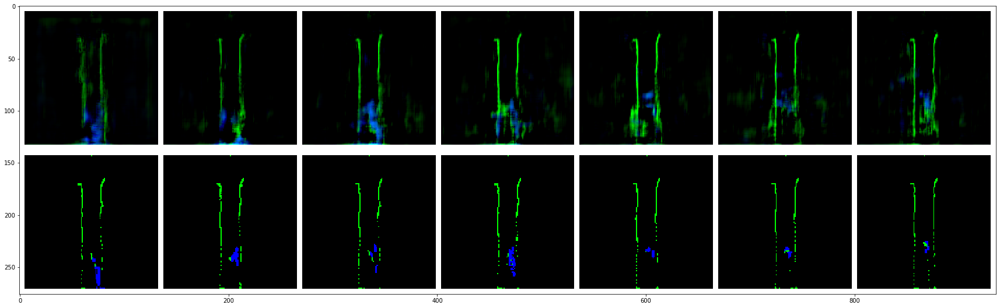

In [19]:
torch.manual_seed(0)
test_dataset = DepthDataset(TEST_FOLDER, 10)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=True)



model.eval()
criterion = nn.MSELoss()

loss_total = 0
count = 0
show_image = True
for sample in test_loader:
  base_frames = sample['frames'][:,:7]
  ground_truth_frame = sample['frames'][:,-7:]
  output = torch.zeros_like(ground_truth_frame)
  for i in range(7):
    output[:,i] = model(base_frames[:,i], i)
  loss = criterion(output, ground_truth_frame)
  loss_total += loss.item()
  count += 1
  if show_image:
    thresholded_output = torch.clamp(output[0], 0, 1)
    pred_image = torchvision.utils.make_grid(thresholded_output, nrow = 7, padding = 5, pad_value = 1)
    gt_image = torchvision.utils.make_grid(ground_truth_frame[0], nrow = 7, padding = 5, pad_value = 1)
    show_image = False

fig, ax = subplots(figsize=(30, 20))
print("Test L2 Loss : ", loss_total/count)
ax.imshow(torch.cat((pred_image, gt_image), dim = 1).detach().cpu().permute(1, 2, 0).cpu())


